# 
<div align="center", style="font-size:350%">
                <font color="#EA1515">
                    <b>  HR ANALYTICS

---
---

## PROBLEM STATEMENT :
---
- Your client is a large MNC and they have 9 broad verticals across the organisation. One of the problem your client is facing is around identifying the right people for promotion (only for manager position and below) and prepare them in time. Currently the process, they are following is:

- They first identify a set of employees based on recommendations/ past performance
Selected employees go through the separate training and evaluation program for each vertical. These programs are based on the required skill of each vertical
- At the end of the program, based on various factors such as training performance, KPI completion (only employees with KPIs completed greater than 60% are considered) etc., employee gets promotion

- They have provided multiple attributes around Employee's past and current performance along with demographics. Now, The task is to predict whether a potential promotee at checkpoint in the test set will be promoted or not after the evaluation process.

## EVALUATION CRITERIA :
---

- F1- Score

## COLUMNS :
---

##### Dataset Description

- employee_id	---------- Unique ID for employee
- department	----------Department of employee
- region	----------Region of employment (unordered)
- education	----------Education Level
- gender	----------Gender of Employee
- recruitment_channel	----------Channel of recruitment for employee
- no_of_trainings	----------no of other trainings completed in previous year on soft skills, technical skills etc.
- age	----------Age of Employee
- previous_year_rating----------	Employee Rating for the previous year
- length_of_service----------	Length of service in years
- KPIs_met >80%	----------if Percent of KPIs(Key performance Indicators) >80% then 1 else 0
- awards_won?	----------if awards won during previous year then 1 else 0
- avg_training_score----------	Average score in current training evaluations
- is_promoted	----------(Target) Recommended for promotion

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b>  IMPORTING BASIC LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import warnings
warnings.simplefilter("ignore")

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b>  IMPORTING THE FILES AND RUNNING THE HEAD

In [2]:
train = pd.read_csv("train.csv")
test  = pd.read_csv("test.csv")
sub   = pd.read_csv("sample.csv")
df    = pd.concat((train,test),ignore_index=True)
df.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0.0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0.0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0.0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0.0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0.0


##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> RUNNING THE INFO AND CHECKING SHAPE

In [3]:
print(df.info(),'\n',df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78298 entries, 0 to 78297
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           78298 non-null  int64  
 1   department            78298 non-null  object 
 2   region                78298 non-null  object 
 3   education             74855 non-null  object 
 4   gender                78298 non-null  object 
 5   recruitment_channel   78298 non-null  object 
 6   no_of_trainings       78298 non-null  int64  
 7   age                   78298 non-null  int64  
 8   previous_year_rating  72362 non-null  float64
 9   length_of_service     78298 non-null  int64  
 10  KPIs_met >80%         78298 non-null  int64  
 11  awards_won?           78298 non-null  int64  
 12  avg_training_score    78298 non-null  int64  
 13  is_promoted           54808 non-null  float64
dtypes: float64(2), int64(7), object(5)
memory usage: 8.4+ MB
None 
 (78298

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> RUNNING FIVE POINT SUMMARY

In [4]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
employee_id,78298.0,NaN,NaN,NaN,39149.5,22602.830026,1.0,19575.25,39149.5,58723.75,78298.0
department,78298,9,Sales & Marketing,24155,NaN,NaN,NaN,NaN,NaN,NaN,NaN
region,78298,34,region_2,17642,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,74855,3,Bachelor's,52247,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,78298,2,m,55092,NaN,NaN,NaN,NaN,NaN,NaN,NaN
recruitment_channel,78298,3,other,43524,NaN,NaN,NaN,NaN,NaN,NaN,NaN
no_of_trainings,78298.0,NaN,NaN,NaN,1.253378,0.606766,1.0,1.0,1.0,1.0,10.0
age,78298.0,NaN,NaN,NaN,34.797619,7.665928,20.0,29.0,33.0,39.0,60.0
previous_year_rating,72362.0,NaN,NaN,NaN,3.332219,1.260982,1.0,3.0,3.0,4.0,5.0
length_of_service,78298.0,NaN,NaN,NaN,5.848974,4.24807,1.0,3.0,5.0,7.0,37.0


##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> TARGET VARIABLE

PERCENTAGE OF VALUES :
---------------------
0.0    0.91483
1.0    0.08517
Name: is_promoted, dtype: float64


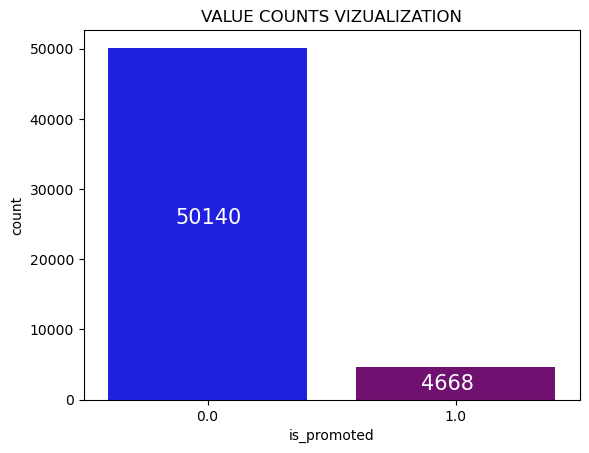

In [13]:
print('PERCENTAGE OF VALUES :\n---------------------')
print(df.is_promoted.value_counts(normalize=True))
sns.countplot(df.is_promoted,palette=['blue','purple'])

plt.text(-0.13,25000,'%d'%(df.is_promoted[df.is_promoted==0.0].size),size=15,color='white')
plt.text(0.86,1400,'%d'%(df.is_promoted[df.is_promoted==1.0].size),size=15,color='white')
plt.title('VALUE COUNTS VIZUALIZATION')
plt.show()

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> CHECKING PERCENTAGE OF CATEGORIES IN CATEGORICAL COLUMN

In [14]:
num_cols = df.select_dtypes(np.number).columns.to_list()
cat_cols = df.select_dtypes(object).columns.to_list()

In [15]:
for i in cat_cols:
    print(i,' ----------> ',df[i].nunique())

department  ---------->  9
region  ---------->  34
education  ---------->  3
gender  ---------->  2
recruitment_channel  ---------->  3


##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> UNIVARIATE ANALYSIS

---

In [22]:
plt.figure(figsize=(30,25),dpi=600)
j = 1
for i in num_cols+cat_cols:
    plt.subplot(5,3,j)
    if i in num_cols:
        sns.distplot(df[i],color='blue')
        plt.title("Skewness = %.3f"%(df[i].skew()))
    else:
        sns.countplot(df[i],palette=['blue','purple','violet','indigo'])
        plt.xticks(rotation=90)
    j+=1
plt.tight_layout()
plt.show()

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> BIVARIATE ANALYSIS

---

In [23]:
plt.figure(figsize=(30,25),dpi=600)
j = 1
for i in num_cols+cat_cols:
    plt.subplot(5,3,j)
    if i in num_cols:
        sns.boxplot(df.is_promoted,df[i],palette=['blue','purple'],)
    else:
        sns.countplot(df[i],hue=df.is_promoted,palette=['blue','purple'])
        plt.xticks(rotation=90)
    j+=1
plt.tight_layout()
plt.show()

In [24]:
cat =['department','region','education','gender','recruitment_channel','no_of_trainings','previous_year_rating','KPIs_met >80%',
    'awards_won?','is_promoted']
num =['age','length_of_service','avg_training_score']

In [30]:
plt.figure(figsize=(50,40),dpi=600)
j = 1
for i in cat:
    plt.subplot(2,5,j)
    sns.countplot(df[i],hue=df.is_promoted,palette=['blue','purple'])
    plt.xticks(rotation=90)
    j+=1
plt.tight_layout()
plt.show()

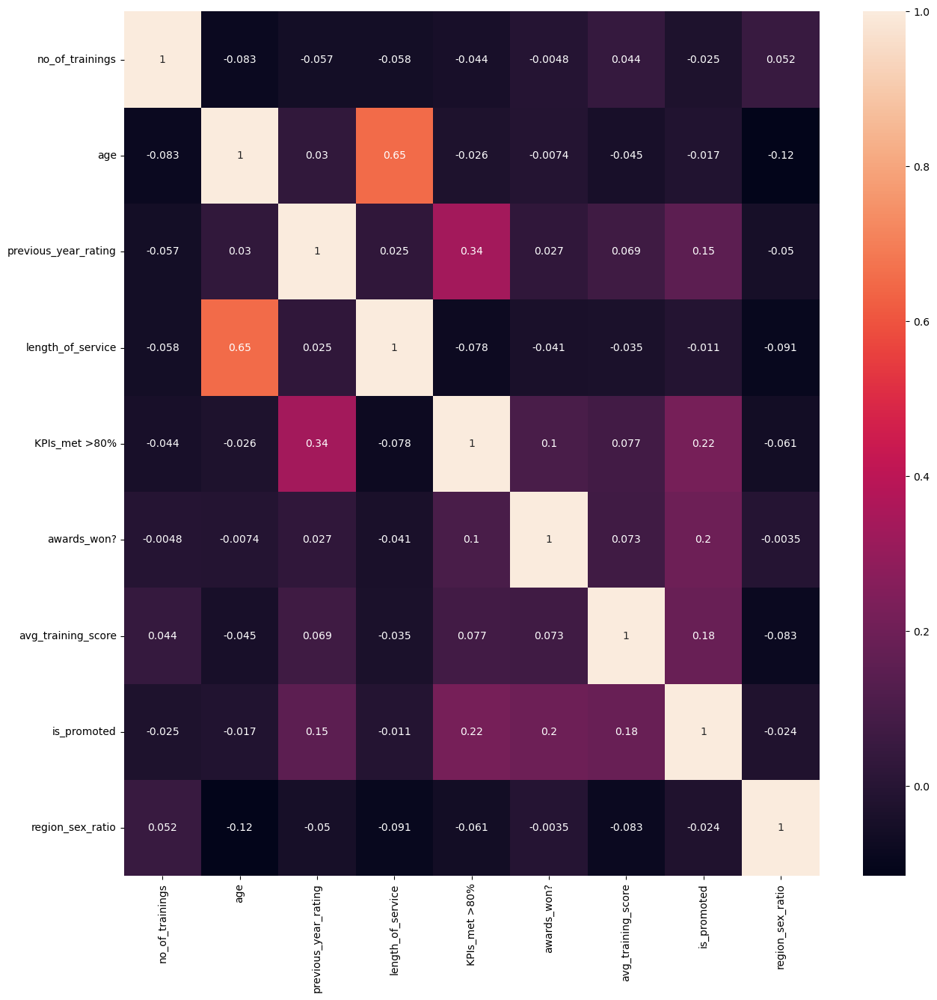

In [81]:
# MULTIVARIATE ANALYSIS

plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True)
plt.show()

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> AS PER THE VISUAL ANALYSIS

* Employees from Bachelor's degree and Master's & above education have higher chances of promotions.
* Employees with education below Secondary have almost negligible chances of promotions.

* Male Employees have higher chances of promotions.

* Employees from other,sourcing recruitment_channel have higher chances of promotions.
* Employees who are referred have very low chances of promotions.

* Employees with no_of_trainings 1 have very high chances of promotions.
* With increasing no_of_trainings, employees have fewer chances of promotions.

* Employees with rating 5 and 3 have higher chances of promotions.
* Employees with rating 1 and 2 have lower chances of promotions.

* Employees with KPIs_met>80% have greater chances of promotions.

* Employees with no awards have higher chances of promotions.

* Employees from all ages have chances of promotion. Age has many outliers.

* Length of service does not much affect the promotions.

* Employees with higher avg_training_score have higher chances of promotions.
* Sales&Marketing, Operations departments have the maximum no. of employees.
* R&D and Legal departments have the least no. of employees.

* region_2 has the maximum number of employees. 
* Maximum of the regions have very less no. of employees.

* Maximum employees have Bachelors Degree.
* The least number of employees have below secondary education.


* The no_of_trainings graph is rightly skewed i.e., 
    there are very low no of employees having high number of skills.
* Maximum employees are of age 28 to 38.


* Employees from Operations,Sales&Marketing,Procurement,Technology departments have high number of promotions.
* Legal and R&D have the least promotions.

* Employees working in region_2,region_22,region_7 have high no. of promotions.

### Univariate analysis summary



In [31]:
cat =['department','region','education','gender','recruitment_channel','no_of_trainings','previous_year_rating','KPIs_met >80%',
    'awards_won?','is_promoted']
num =['age','length_of_service','avg_training_score']

print("Categorical Variables :\n----------------------\n\n",cat,'\n\n')
print("Numerical   Variables :\n----------------------\n\n",num,'\n')

Categorical Variables :
----------------------

 ['department', 'region', 'education', 'gender', 'recruitment_channel', 'no_of_trainings', 'previous_year_rating', 'KPIs_met >80%', 'awards_won?', 'is_promoted'] 


Numerical   Variables :
----------------------

 ['age', 'length_of_service', 'avg_training_score'] 



##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> MISSING VALUES

---

In [41]:
print((df.isnull().sum()/df.shape[0])*100)

employee_id              0.000000
department               0.000000
region                   0.000000
education                0.000000
gender                   0.000000
recruitment_channel      0.000000
no_of_trainings          0.000000
age                      0.000000
previous_year_rating     0.000000
length_of_service        0.000000
KPIs_met >80%            0.000000
awards_won?              0.000000
avg_training_score       0.000000
is_promoted             30.000766
dtype: float64


In [40]:
for i in df.columns[:-1]:
    if i in cat:
        df[i].fillna(df[i].mode()[0],inplace=True)
    if i in num:
        df[i].fillna(df[i].median(),inplace=True)

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> FEATURE ENGINEERING AND FEATURE MANIPULATION

---

In [42]:
df['Gratuity']=np.where(df.length_of_service>5,1,0)

In [62]:
d = dict()
for i in df.department.unique():
    d[i]= df[(df.department==i) & (df.gender=='m')]['gender'].shape[0]/df[df.department==i].shape[0]
df['region_sex_ratio'] = df.department.map(d)

In [44]:
# DROPPING EMPLOYEE ID

del df['employee_id']

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> STATISTICAL ANALYSIS

---

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> APPLYING TESTS

In [77]:
li = []
for i in df.columns:
        if i !='is_promoted':
            if i not in cat:
                a = df[df.is_promoted==0.0][i]
                b = df[df.is_promoted==1.0][i]
                if round(stats.mannwhitneyu(a,b)[1],3)<0.05:
                    li.append(i)
            else:
                if round(stats.chi2_contingency(pd.crosstab(df[i],df.is_promoted))[1],3)<0.05:
                    li.append(i)
print('Significant Columns :',li)

Significant Columns : ['department', 'region', 'education', 'gender', 'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating', 'KPIs_met >80%', 'awards_won?', 'avg_training_score', 'region_sex_ratio']


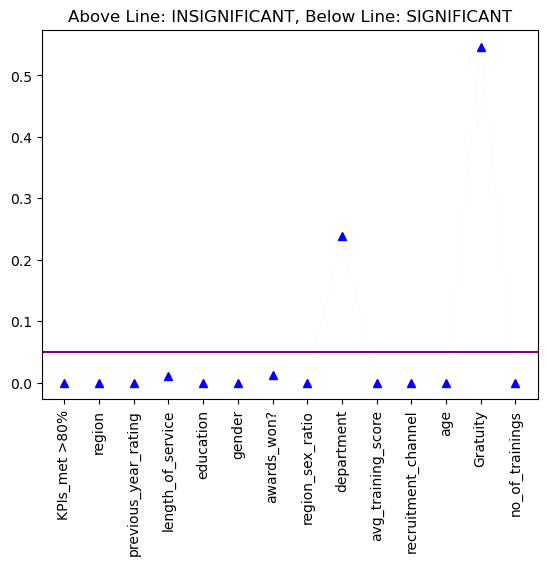

In [79]:
p = []
for i in df.columns:
        if i !='is_promoted':
            if i not in cat:
                a = df[df.is_promoted==0.0][i]
                b = df[df.is_promoted==1.0][i]
                p.append(round(stats.mannwhitneyu(a,b)[1],3))
            else:
                p.append(round(stats.chi2_contingency(pd.crosstab(df[i],df.is_promoted))[1],3))
plt.plot(list(set(df.columns)-{'is_promoted'}),p,color='blue',marker='^',lw=0.01)
plt.xticks(rotation=90)
plt.title('Above Line: INSIGNIFICANT, Below Line: SIGNIFICANT')
plt.axhline(y=0.05,color='purple')
plt.show()

In [80]:
# REMOVING INSIGNIFICANT COLUMNS

df.drop(columns=['department','Gratuity'],inplace=True)

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> DATA PREPROCESSING

---

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> SPLITTING THE DATA INTO TRAIN AND TEST

In [119]:
train = df[df.is_promoted.notnull()]
test  = df[df.is_promoted.isnull()].drop('is_promoted',axis=1)
X = train.drop('is_promoted',axis=1)
y = train.is_promoted

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> SCALING THE NUMERICAL DATA

In [120]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()                           # INITIATING MACHINE INSTANCE
for i in num+['region_sex_ratio']:
    X[i] = sc.fit_transform(pd.DataFrame(X[i]))
    test[i] = sc.transform(pd.DataFrame(test[i]))

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> ENCODING THE CATEGORICAL DATA (FREQUENCY ENCODING)

In [121]:
X.region = X.region.map((X.region.value_counts()/X.shape[0]).to_dict())
test.region = test.region.map((test.region.value_counts()/test.shape[0]).to_dict())

In [122]:
X = pd.get_dummies(X)
test = pd.get_dummies(test)

In [123]:
# for i in X.select_dtypes('O').columns:
#     for j in X[i].unique():
#         X.loc[df[i]==j,i] = X.loc[df[i]==j,i].shape[0]/X.shape[0]
# for i in test.select_dtypes('O').columns:
#     for j in test[i].unique():
#         test.loc[df[i]==j,i] = test.loc[df[i]==j,i].shape[0]/test.shape[0]
# for i in X.select_dtypes('O'):
#     X[i] = X[i].astype(np.number)
#     test[i] = test[i].astype(np.number)

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> CHECKING FOR IMBALANCE IN THE DATA AND FIXING IT

In [124]:
print('OLD RATIO :\n')

print(y.value_counts(normalize=True))

from imblearn.over_sampling import ADASYN,SMOTE
X,y = ADASYN().fit_resample(X,y)

print('New Ratio :\n')

print(y.value_counts(normalize=True))

OLD RATIO :

0.0    0.91483
1.0    0.08517
Name: is_promoted, dtype: float64
New Ratio :

0.0    0.5025
1.0    0.4975
Name: is_promoted, dtype: float64


##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> MODELLING

---

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> IMPORTING THE LIBRARIES AND FUNCTIONS

In [125]:
from sklearn.linear_model import LogisticRegression,RidgeClassifier
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,StackingClassifier,BaggingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,precision_score,recall_score,f1_score,\
roc_curve,log_loss
from sklearn.model_selection import cross_val_score,StratifiedKFold

##### 
<div align="left", style="font-size:140%">
                <font color="#151EDA">
                    <b> CROSS VALIDATING THE MODELS USING STRATIFIED KFOLD CROSS VALIDATION AND EVALUATING

In [126]:
# CREATING MACHINE INSTANCE

lr  = LogisticRegression()
rg  = RidgeClassifier()
dt  = DecisionTreeClassifier()
rf  = RandomForestClassifier()
xg  = XGBClassifier()
ca  = CatBoostClassifier(verbose=0)
ad  = AdaBoostClassifier()
gb  = GradientBoostingClassifier()
lg  = LGBMClassifier()
knn = KNeighborsClassifier(n_neighbors=3)
gn  = GaussianNB()
st  = StackingClassifier([('dt',DecisionTreeClassifier()),('rf',RandomForestClassifier())],final_estimator=lr,stack_method='predict')

In [127]:
cv = StratifiedKFold(n_splits=5,shuffle=True)

for m in [lr,rg,dt,rf,xg,ca,knn,st]:
    print('\t\t',m,'\n')
    for i,j in cv.split(X,y):
        xtr,xte,ytr,yte = X.loc[i],X.loc[j],y[i],y[j]
        model = m.fit(xtr,ytr)
        pred_tr,pred_te = model.predict(xtr),model.predict(xte)
        print(round(f1_score(ytr,pred_tr),4),' , ',round(f1_score(yte,pred_te),4))
    print('\n')

		 LogisticRegression() 

0.719  ,  0.7191
0.719  ,  0.7221
0.7188  ,  0.717
0.72  ,  0.7147
0.717  ,  0.7213


		 RidgeClassifier() 

0.7239  ,  0.7209
0.7229  ,  0.7234
0.7239  ,  0.7241
0.7237  ,  0.7241
0.7239  ,  0.7242


		 DecisionTreeClassifier() 

0.9998  ,  0.9368
0.9999  ,  0.9358
0.9999  ,  0.9365
0.9999  ,  0.9353
0.9999  ,  0.9361


		 RandomForestClassifier() 

0.9999  ,  0.9617
0.9999  ,  0.9629
0.9999  ,  0.9626
0.9999  ,  0.9615
0.9999  ,  0.961


		 XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_dept

In [128]:
# USING XG BOOST CLASSIFIER AS FINAL MODEL .

In [129]:
model = xg.fit(X,y)

In [144]:
sub['is_promoted'] = model.predict(test)
sub.to_csv('hr1.csv')

In [137]:
cd

C:\Users\prabh
